In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from parameters import Parameters
import convtas
import IPython.display as ipd
import sys
sys.path.append('../audio_processing')
import musdb
import datasets
import librosa

Im gonna try to load in some different samples that were hopefully not trained on. Just to examine the output and if its the same mess that means I am going to have to look deeper at to what my model isn't doing. 

In [2]:
root_mus = '../MUSDB18'
mus = musdb.DB(download=True, subsets="test")

In [3]:
def load_display_song(mus, idx):
    track = mus[idx]
    sr = track.rate
    audio = librosa.to_mono(track.audio.T) # to mono i think i could make it stereo by just feeding each channel separately then combining.
    stems = [librosa.to_mono(track.stems[i].T) for i in range(1,5)]
    print(track.name)
    print(audio.shape)
    ipd.display(ipd.Audio(data=audio, rate=sr))

    return audio, sr, stems

In [4]:
audio, sr, stems = load_display_song(mus, 3)

Arise - Run Run Run
(300032,)


In [5]:
M, C, T = (len(audio)//400)+1, 4, 400

pad = M*T - len(audio)

padded_audio = np.pad(audio, (0,pad), mode='wrap') # Pads values at beginning to get correct size.
model_input = np.reshape(padded_audio, (M, T))
print(model_input.shape)

(751, 400)


In [2]:
checkpoint_path = "training_final_full/cp.ckpt"
param = Parameters()
cnn = convtas.ConvTasNet(param)
cnn.load_weights(checkpoint_path)

In [7]:
output = cnn(model_input)
print(output.shape)

(751, 4, 400)


In [15]:
cnn.weights[3]

<tf.Variable 'ConvTasNet/Separator/conv1d_1/kernel:0' shape=(1, 512, 128) dtype=float32, numpy=
array([[[-0.07611685,  0.01629519, -0.02627654, ...,  0.01950199,
         -0.10592849,  0.03614245],
        [-0.0428823 , -0.08727133,  0.01627463, ..., -0.0700694 ,
         -0.04131191, -0.0652279 ],
        [-0.03212293, -0.00994519, -0.08919599, ...,  0.01971694,
          0.12467612,  0.0900279 ],
        ...,
        [-0.0084637 , -0.04587362,  0.03550331, ..., -0.07296204,
          0.00791054, -0.05766963],
        [ 0.08943674,  0.08312419,  0.02174174, ..., -0.06835429,
          0.00902009,  0.09520718],
        [ 0.02151676,  0.13919245, -0.10322779, ..., -0.0698632 ,
          0.0244759 ,  0.11352137]]], dtype=float32)>

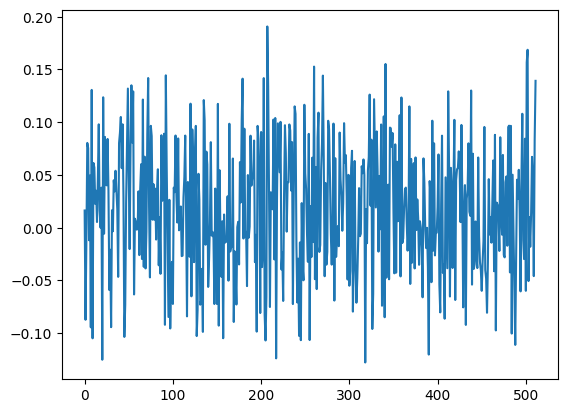

In [17]:
conv1d_kern = cnn.weights[3]
plt.plot(conv1d_kern[0,:,1])

In [10]:
def sep_audio(output, output_size, pad, num_sources=4):
    separated=[]
    for i in range(num_sources):
        est = output[:,i,:]
        est_audio = np.reshape(est, (output_size,))[:-pad]
        separated.append(est_audio)
    
    return separated

def plot_listen_est(separated, original_audio):
    # Creates structure for plots
    fig, axes = plt.subplots(1,4, figsize=(12,4))
    sources = ["Drums", "Bass", "Other", "Vocals"]

    print('True Signal')
    ipd.display(ipd.Audio(data=original_audio, rate=44100))
    for i in range(4):
        axes[i].plot(original_audio, label="Orignal Mix", alpha=.3)
        axes[i].plot(separated[i], label=f"Source Est", alpha=.4)
        print(f'Estimated {sources[i]}')
        ipd.display(ipd.Audio(data=separated[i], rate=44100))
        if i==0:
            fig.legend()
            fig.add_gridspec()

        axes[i].set_title(f"Source: {sources[i]}")

In [11]:
def plot_true_to_est(separated, original_audio, stems):
    # Creates structure for plots
    fig, axes = plt.subplots(1,4, figsize=(12,4))
    sources = ["Drums", "Bass", "Other", "Vocals"]

    print('True Signal')
    ipd.display(ipd.Audio(data=original_audio, rate=44100))
    for i in range(4):
        axes[i].plot(original_audio, label="Orignal Mix", alpha=.2)
        axes[i].plot(stems[i], label=f"Source True", alpha=.3,color='green')
        axes[i].plot(separated[i], label=f"Source Est", alpha=.5,color='orange')
        axes[i].grid()
        
        print(f'Estimated {sources[i]}')
        ipd.display(ipd.Audio(data=separated[i], rate=44100))
        print(f'True {sources[i]}')
        ipd.display(ipd.Audio(data=stems[i], rate=44100))
        if i==0:
            fig.legend()

        axes[i].set_title(f"Source: {sources[i]}")


True Signal


Estimated Drums


True Drums


Estimated Bass


True Bass


Estimated Other


True Other


Estimated Vocals


True Vocals


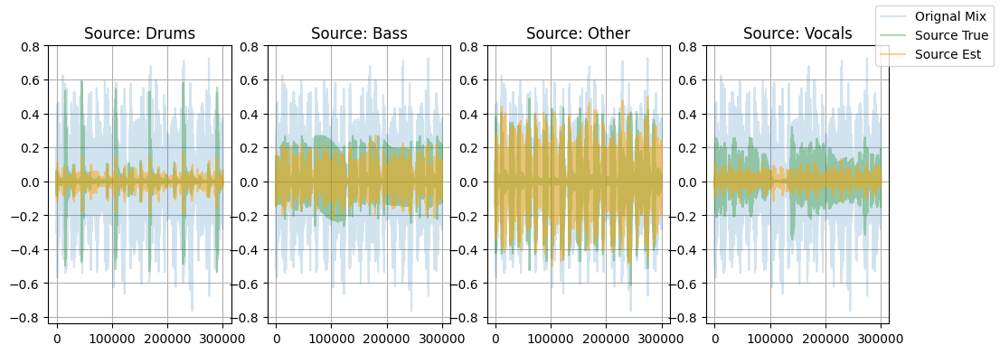

In [12]:
separated = sep_audio(output, M*T, pad)
plot_true_to_est(separated, audio, stems)

And that's our estimation, definitely not amazing but pretty impressive when you realize this was only trained for 2 epochs. Listening to the audio recordings, it seems the model isn't confident cutting out completely any part of the song from its estimations. The estimations will all have some interference from other sources in the estimations. However, it's clear that the model is trying harder to pick up the sources it is trying to estimate. In the drums estimate you can hear the drums more clearly than in any other estimate, same with the bass and vocals etc.

Visually the estimations, deinitely still leave a lot to be desired, however, certain sources like the bass are quite impressive in how close they appear to be matching the target source. The other source category is also quite impressive in covering most of the target source. Drums and vocals both seem to be quite lackluster visually though. It's interesting how the drums seem to not want to fully commit to the full attack of the percussion when it hits. It can follow the beat somewhat, but it does not want to give the fully impact of the drums. 

In [13]:
def plot_res(s_hat, s):
    residuals = [(s[i]-s_hat[i]) for i in range(len(s_hat))]
    # Creates structure for plots
    fig, axes = plt.subplots(1,4, figsize=(12,4))
    sources = ["Drums", "Bass", "Other", "Vocals"]

    for i in range(4):
        axes[i].plot(residuals[i], label=f"{sources[i]}", alpha=.5, color='red')
        axes[i].grid()

        axes[i].set_title(f"Source: {sources[i]}")

    return residuals
    

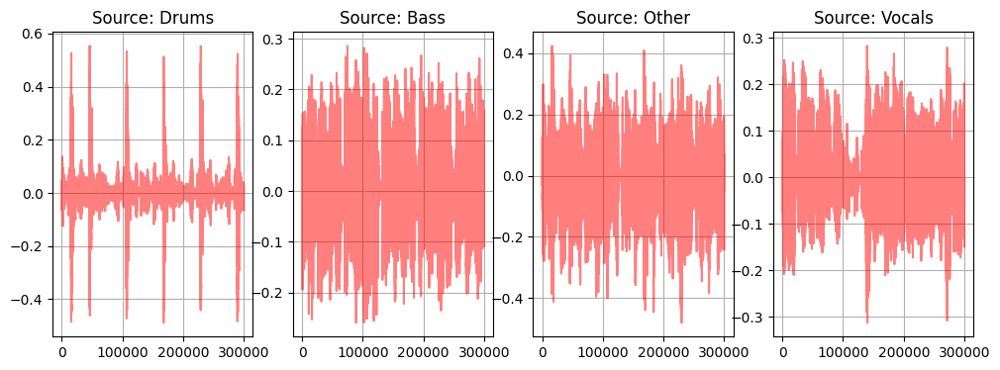

In [14]:
residuals = plot_res(separated, stems)

In [15]:
from statsmodels.tsa.stattools import pacf, acf
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

In [16]:
def plot_acf_pacf(residuals):

    fig, axes = plt.subplots(2,4,figsize=(12,8))
    axes = axes.flatten()
    sources = ['Drums','Bass','Other','Vocals']

    for i in range(4):
        plot_acf(residuals[i],ax=axes[i],alpha=.05)
        axes[i].set_title(f'{sources[i]}')
        plot_pacf(residuals[i],ax=axes[i+4],alpha=.05)
        axes[i+4].set_title(f'{sources[i]}')


In [17]:
plot_acf_pacf(residuals)

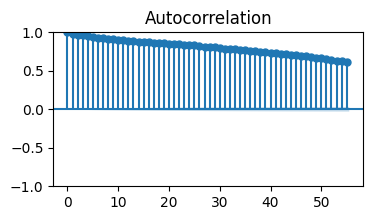

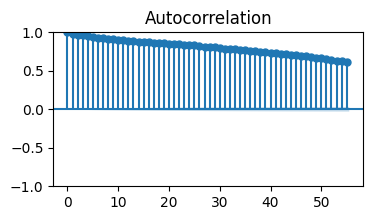

In [ ]:
fig, axes = plt.subplots(1,1,figsize=(4,2))
plot_acf(residuals[0], ax=axes)

In [ ]:
mus = musdb.DB(download=True, subsets='train')

train_audio, sr, train_stems = load_display_song(mus, idx=66)

Port St Willow - Stay Even
(300032,)


In [ ]:
M, C, T = (len(train_audio)//400)+1, 4, 400

n = M*T - len(audio)

padded_train_audio = np.pad(train_audio, (0,n), mode='wrap') # Pads values at beginning to get correct size for model input
model_train_input = np.reshape(padded_train_audio, (M, T))
print(model_train_input.shape)

(751, 400)


In [ ]:
output_train = cnn(model_train_input) # Inputs song into model
print(output_train.shape)

(751, 4, 400)


True Signal


Estimated Drums


True Drums


Estimated Bass


True Bass


Estimated Other


True Other


Estimated Vocals


True Vocals


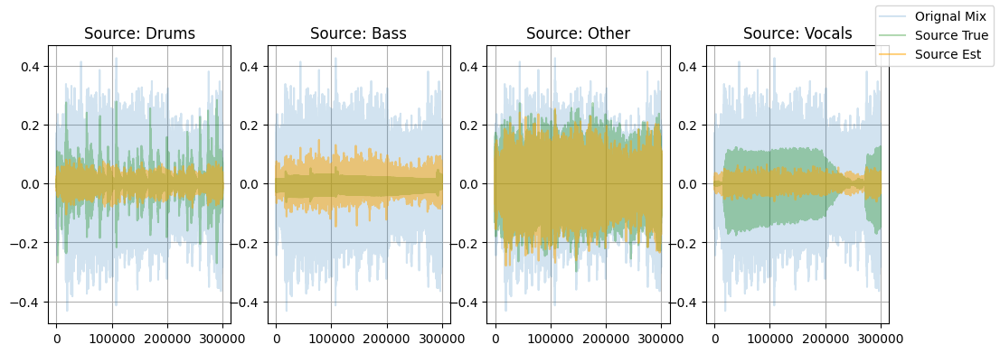

In [ ]:
train_separated = sep_audio(output_train, M*T)
plot_true_to_est(train_separated, train_audio, train_stems)

This is really unfortunate it seems like something in the process is making all the outputs train in the same way. If there is a way to examine the weights, maybe there is some way to figure out where this is occuring. 